In [10]:
%matplotlib inline
import shutil, os, sys, glob
import numpy as np
from matplotlib import pyplot as plt
import ipyvolume as ipv
#
sys.path.append('/home/fpoitevi/notebooks/cryo_home/slaclab/cryoEM-notebooks/src/')
import cryoemio
import imutils
import dataviz
import mrcutils
import componentutils as cmp
import clusterutils as cluster

In [2]:
PROJECT_DIR  = '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/'
DATA_DIR     = PROJECT_DIR+'MultiBody/bin4_ofbin6postautopickgoodgood/'
ANALYSIS_DIR = PROJECT_DIR+'MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/'

In [28]:
glob.glob(ANALYSIS_DIR+'/*.dat')

['/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/init_gmm_dim18_n2_cluster_1_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/init_gmm_dim18_n2_cluster_0_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/init_gmm_dim18_n2_eigvec.dat']

In [12]:
projection_file  = DATA_DIR+'analyse_projections_along_eigenvectors_all_particles.txt'
eigenvector_file = DATA_DIR+'analyse_eigenvectors.dat'

Load data [check out eigenvectors and eigenvalues]:
Number of dimensions : 18
Number of components : 18
Number of particles  : 461561


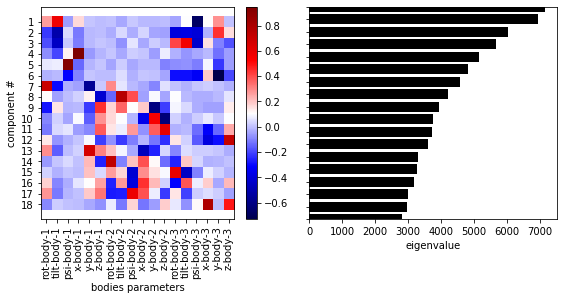

In [13]:
print('Load data [check out eigenvectors and eigenvalues]:')
ids,dims,U,L,Vt = cmp.load_pca(projection_file,eigenvector_file)

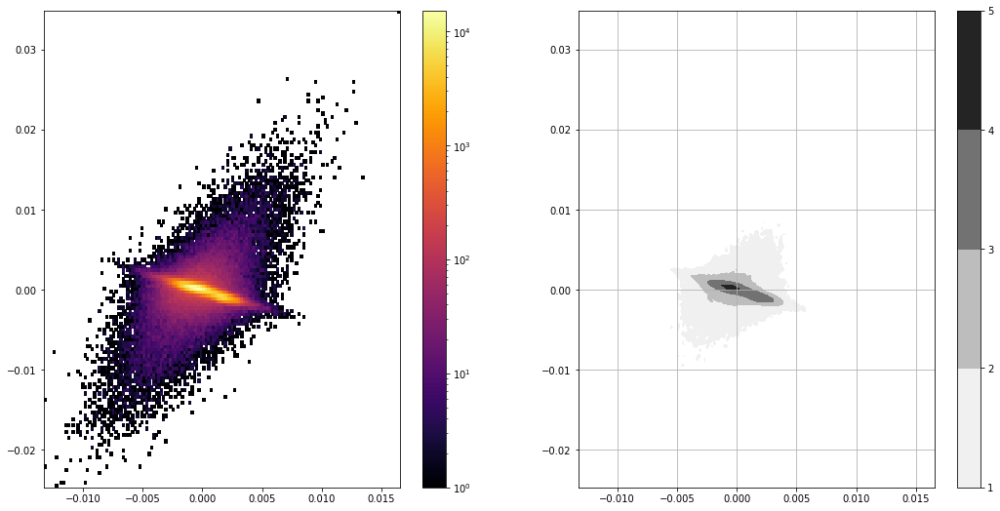

In [16]:
dataviz.biplot_histncontour(Vt[0,:],Vt[1,:], levels=[1,2,3,4,5])

Check particle coordinates in eigenspace:


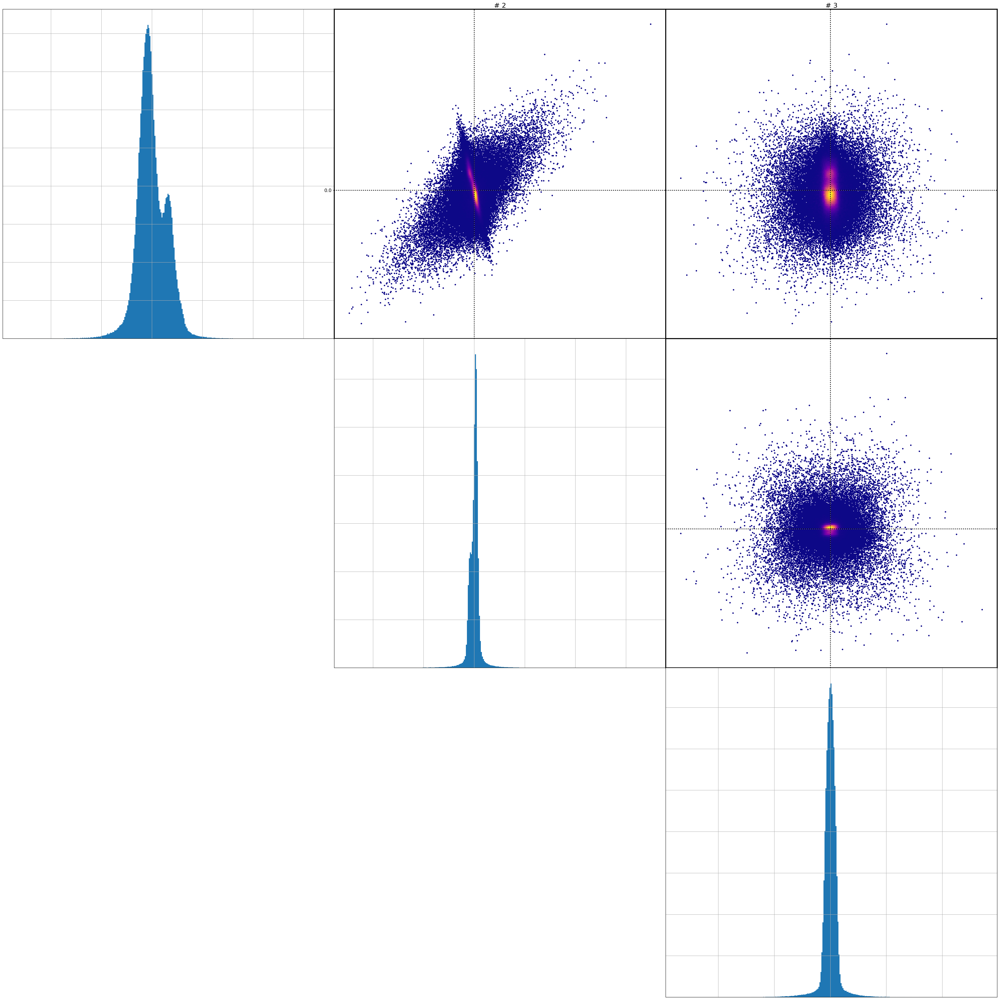

In [18]:
print('Check particle coordinates in eigenspace:')
nplot=3 #len(dims)
dataviz.biplots(Vt.T,n=nplot,nbins=300,figsize=6,show_histo=True)

Scan GMM:
 BIC( 1 ) =  -84248190.65468438 BIC( 2 ) =  -86918416.82196546 BIC( 3 ) =  -87201195.78925142 BIC( 4 ) =  -87471596.3480422 BIC( 5 ) =  -87484153.2475574 BIC( 6 ) =  -87525294.34276167 BIC( 7 ) =  -87504477.71278024 BIC( 8 ) =  -87557565.7883008 BIC( 9 ) =  -87631904.54660416 BIC( 10 ) =  -87672819.73064154

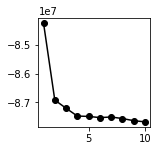

In [20]:
print('Scan GMM:')
n_dim  = 18
n_gauss_max = 10 #len(dims)
best_gmm, bic = cluster.scan_gmm(Vt.T[:,0:n_dim],n_components=n_gauss_max)

In [26]:
print('Do GMM:')
n_components = 2
assignment, index = cluster.assign_gmm(Vt.T[:,0:n_dim],n_components=n_components)

Do GMM:
. component  0  has  413315  particles
. component  1  has  48246  particles


Check particle coordinates in eigenspace, with their assignment:


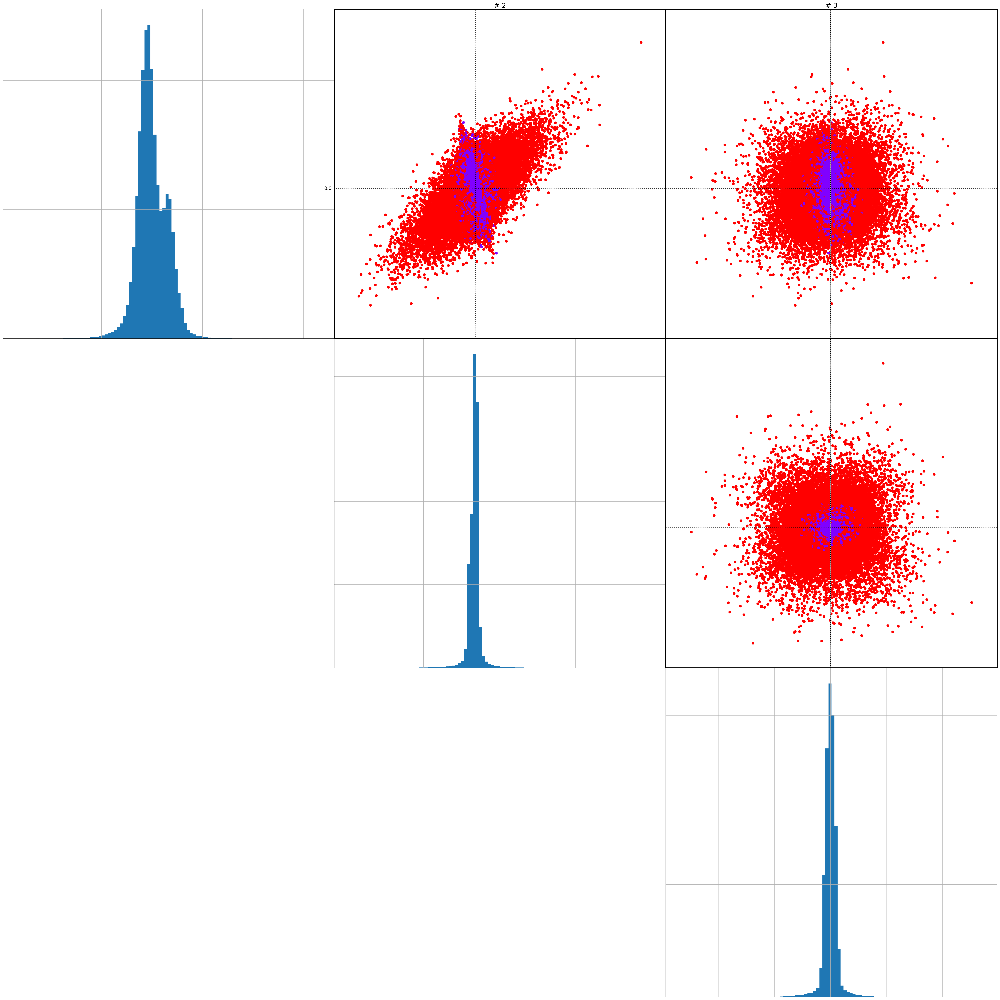

In [27]:
print('Check particle coordinates in eigenspace, with their assignment:')
nplot=3 #len(dims)
dataviz.biplots(Vt.T,n=nplot,nbins=100,figsize=6,show_histo=True,c=assignment)

In [29]:
cmp.save_cluster(ids,dims,U,L,Vt,c=assignment,keyword=ANALYSIS_DIR+'init_gmm_dim18_n2')

In [30]:
glob.glob(ANALYSIS_DIR+'*')

['/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/init_gmm_dim18_n2_cluster_1_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/init_gmm_dim18_n2_cluster_0_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/init_gmm_dim18_n2_eigvec.dat']

## Analyse main cluster

In [31]:
projection_file  = ANALYSIS_DIR+'init_gmm_dim18_n2_cluster_0_projs.dat'
eigenvector_file = ANALYSIS_DIR+'init_gmm_dim18_n2_eigvec.dat'

Load data [check out eigenvectors and eigenvalues]:
Number of dimensions : 18
Number of components : 18
Number of particles  : 413315


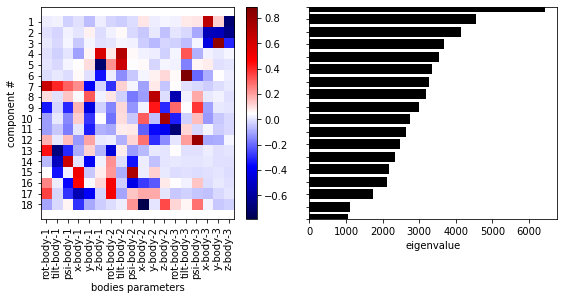

In [33]:
print('Load data [check out eigenvectors and eigenvalues]:')
ids,dims,U,L,Vt = cmp.load_pca(projection_file,eigenvector_file, as_is=False)

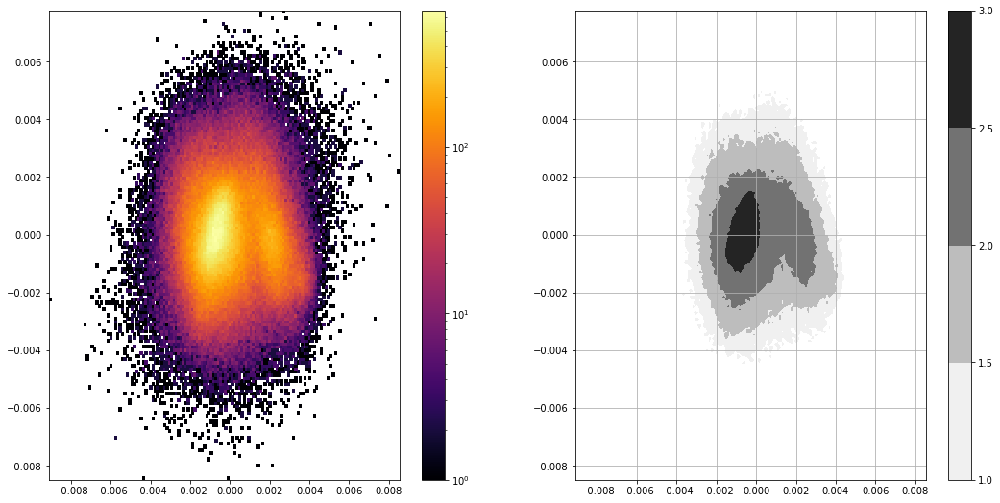

In [36]:
dataviz.biplot_histncontour(Vt[0,:],Vt[1,:], levels=[1,1.5,2,2.5,3])

Check particle coordinates in eigenspace:


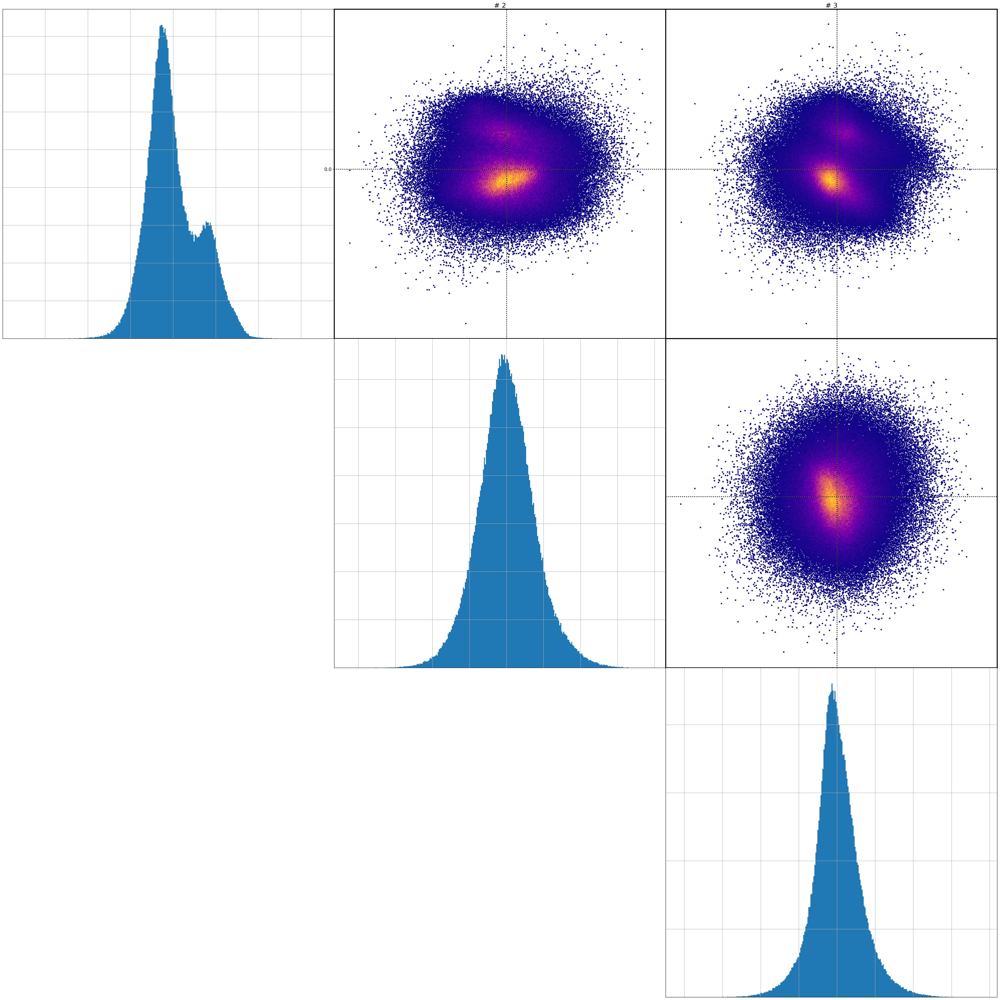

In [37]:
print('Check particle coordinates in eigenspace:')
nplot=3 #len(dims)
dataviz.biplots(Vt.T,n=nplot,nbins=300,figsize=6,show_histo=True)

Scan GMM:
 BIC( 1 ) =  -74696260.8544092 BIC( 2 ) =  -75904115.18239844 BIC( 3 ) =  -76044449.60593532 BIC( 4 ) =  -76059727.49655843 BIC( 5 ) =  -76319156.15655206 BIC( 6 ) =  -76343272.54662628 BIC( 7 ) =  -76356283.03783937 BIC( 8 ) =  -76401597.70993869 BIC( 9 ) =  -76409644.64462069 BIC( 10 ) =  -76412475.51874983

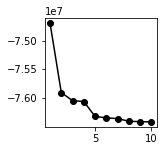

In [38]:
print('Scan GMM:')
n_dim  = 18
n_gauss_max = 10 #len(dims)
best_gmm, bic = cluster.scan_gmm(Vt.T[:,0:n_dim],n_components=n_gauss_max)

In [44]:
print('Do GMM:')
n_components = 2
assignment, index = cluster.assign_gmm(Vt.T[:,0:n_dim],n_components=n_components)

Do GMM:
. component  0  has  43294  particles
. component  1  has  370021  particles


Check particle coordinates in eigenspace, with their assignment:


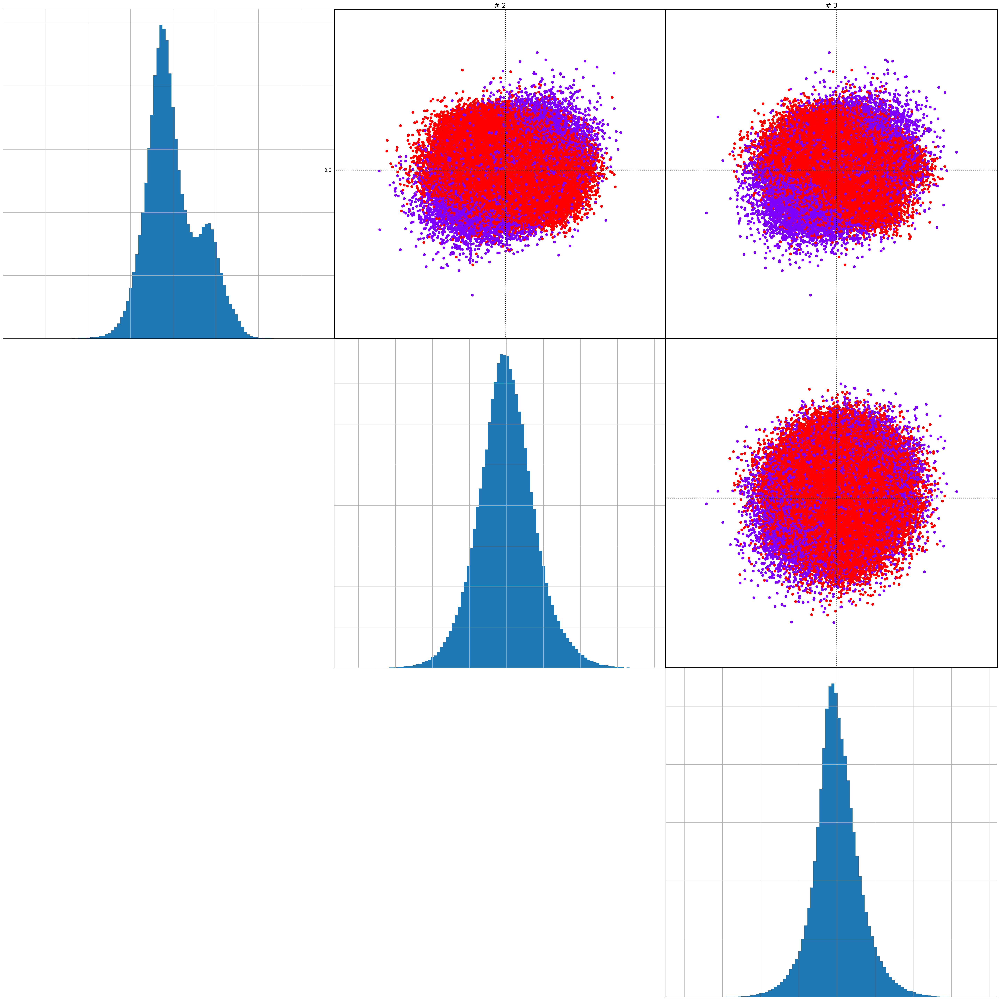

In [45]:
print('Check particle coordinates in eigenspace, with their assignment:')
nplot=3 #len(dims)
dataviz.biplots(Vt.T,n=nplot,nbins=100,figsize=6,show_histo=True,c=assignment)

Looks like further cleaning. Let's roll with it...

In [46]:
cmp.save_cluster(ids,dims,U,L,Vt,c=assignment,keyword=ANALYSIS_DIR+'c0_gmm_dim18_n2')

In [47]:
glob.glob(ANALYSIS_DIR+'*')

['/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/init_gmm_dim18_n2_cluster_1_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/init_gmm_dim18_n2_cluster_0_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/c0_gmm_dim18_n2_cluster_1_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/c0_gmm_dim18_n2_eigvec.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/c0_gmm_dim18_n2_cluster_0_projs.dat',
 '/gpfs/slac/cryo/fs1/u/fpoitevi/processing/20181005-rib-TEM4/MultiBodyAnalysis/bin4_ofbin6postautopickgoodgood/init_gmm_dim18_n2_eigvec.dat']

## Continue

In [48]:
projection_file  = ANALYSIS_DIR+'c0_gmm_dim18_n2_cluster_1_projs.dat'
eigenvector_file = ANALYSIS_DIR+'c0_gmm_dim18_n2_eigvec.dat'

Load data [check out eigenvectors and eigenvalues]:
Number of dimensions : 18
Number of components : 18
Number of particles  : 370021


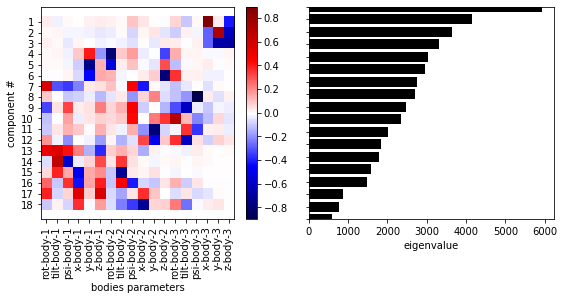

In [49]:
print('Load data [check out eigenvectors and eigenvalues]:')
ids,dims,U,L,Vt = cmp.load_pca(projection_file,eigenvector_file, as_is=False)

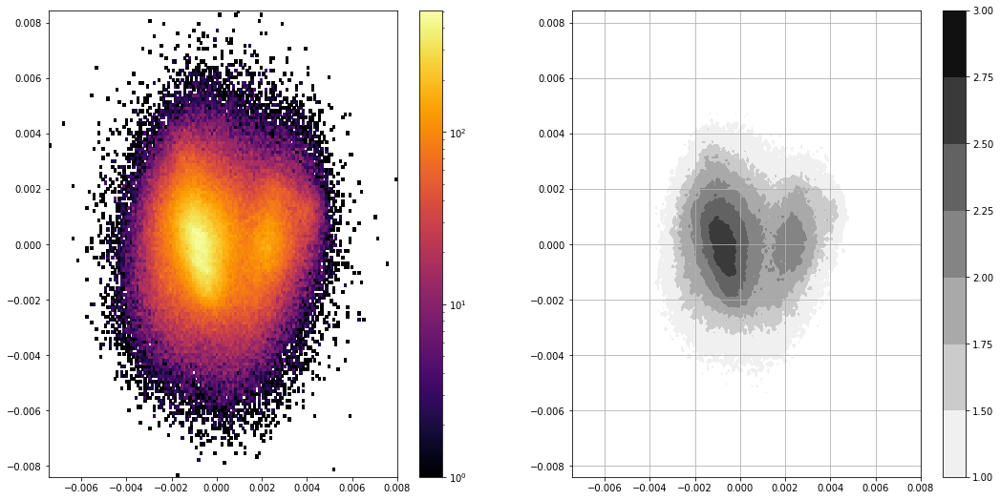

In [52]:
dataviz.biplot_histncontour(Vt[0,:],Vt[1,:], levels=[1,1.5,1.75,2,2.25,2.5,2.75,3])

Check particle coordinates in eigenspace:


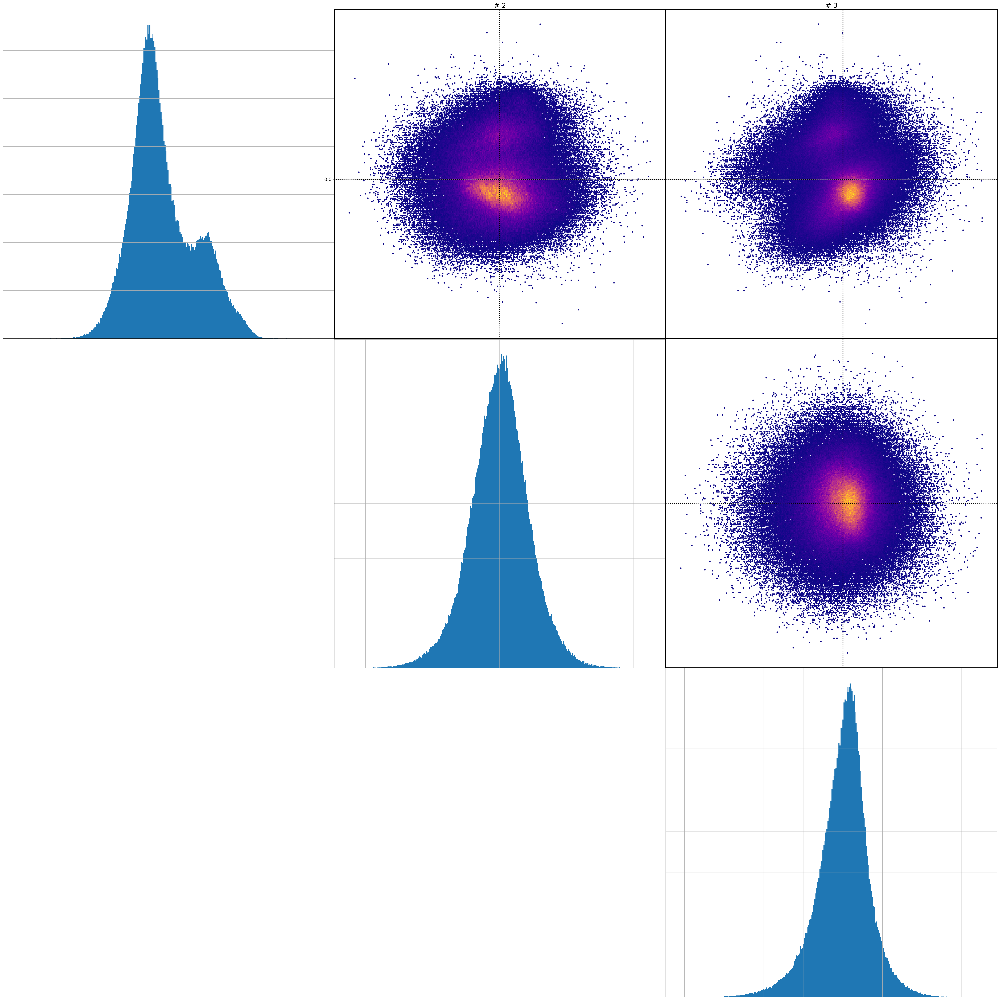

In [53]:
print('Check particle coordinates in eigenspace:')
nplot=3 #len(dims)
dataviz.biplots(Vt.T,n=nplot,nbins=300,figsize=6,show_histo=True)

Scan GMM:
 BIC( 1 ) =  -3677500.621940523 BIC( 2 ) =  -3678688.0458532707 BIC( 3 ) =  -3678561.7853494748 BIC( 4 ) =  -3678602.7385406336 BIC( 5 ) =  -3678597.7403856334 BIC( 6 ) =  -3678572.5047727213 BIC( 7 ) =  -3678547.636935037 BIC( 8 ) =  -3678516.533914554 BIC( 9 ) =  -3678483.309745139 BIC( 10 ) =  -3678449.4414990186

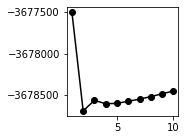

In [62]:
print('Scan GMM:')
n_dim  = 1
n_gauss_max = 10 #len(dims)
best_gmm, bic = cluster.scan_gmm(Vt.T[:,0:n_dim],n_components=n_gauss_max)

In [60]:
print('Do GMM:')
n_components = 3
assignment, index = cluster.assign_gmm(Vt.T[:,0:n_dim],n_components=n_components)

Do GMM:
. component  0  has  325694  particles
. component  1  has  37421  particles
. component  2  has  6906  particles


Check particle coordinates in eigenspace, with their assignment:


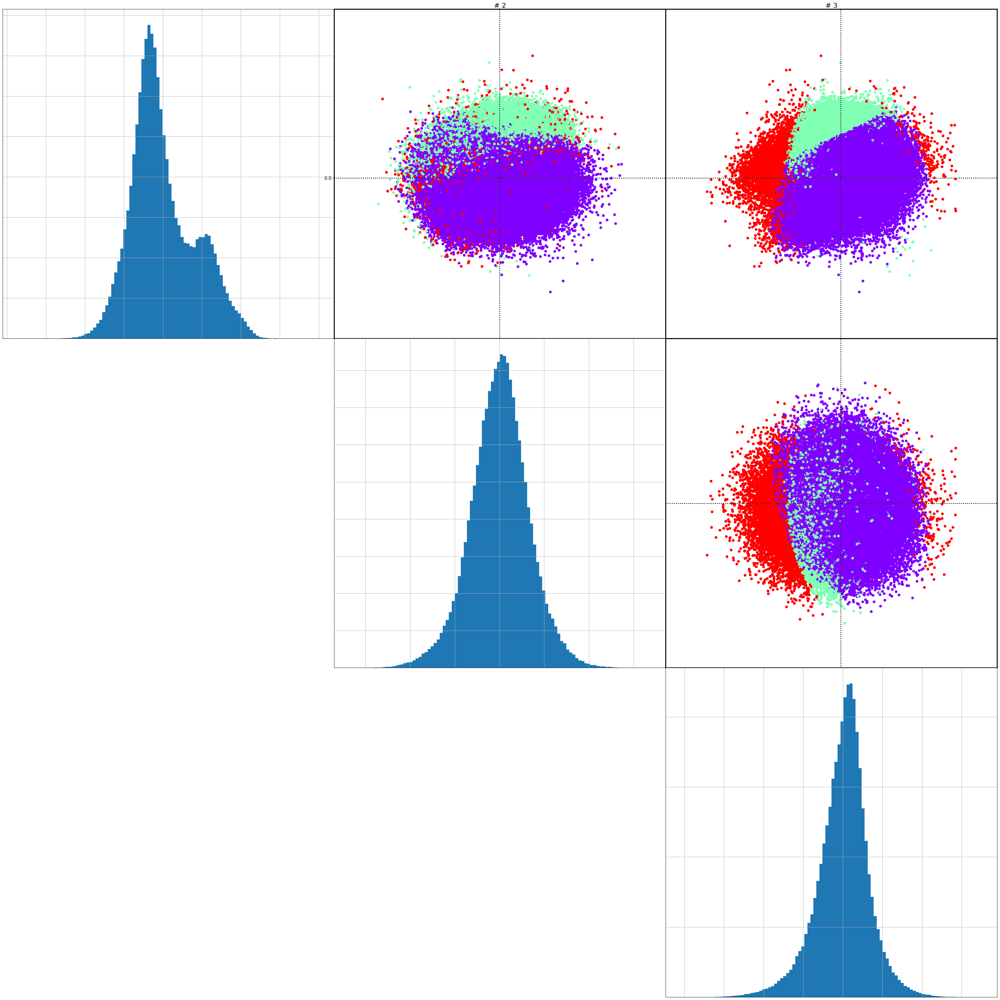

In [61]:
print('Check particle coordinates in eigenspace, with their assignment:')
nplot=3 #len(dims)
dataviz.biplots(Vt.T,n=nplot,nbins=100,figsize=6,show_histo=True,c=assignment)